In [1]:
import os, glob, h5py, glob, sys, warnings, tqdm
import warnings
from timeit import default_timer as timer
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gp
from pyproj import Transformer
from pyproj import proj
import rasterio

sys.path.append(r'C:\Users\Sebastian\U\Spatial\Internship\Bodo_website\ICESat-2_SVDA-main\python')

#from SVDA_helper_functions import *
from SVDA_functions import *
from pc_pool_clip  import *

In [ ]:
#Opening the H5 file, selection the EPSG, output and exporting it as HDF file

#Input
ATL03_20200428193512 = '/DATA/Seb/internship/ATL03/fill_data/ATL03_20200428193512_05080706_005_01.h5'

#Output
ATL03_output_path = r"D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\big_hdf"

#Region of interest to be clipped from ATL03 file:
ROI_fname = r'C:\Users\Sebastian\U\Spatial\Internship\NSIDC\new_study_area\new_area-polygon.shp'
EPSG = 'epsg:7763'

#looping thorugh the files and esporting them as HDF
ATL03_files = list(glob.glob(ATL03_20200428193512))
ATL03_files.sort()
for fname in ATL03_files:
    ATL03_signal_photons(fname, ATL03_output_path, ROI_fname, EPSG, reprocess=False)

In [3]:
#Opening HDf files Land_*.hdf
ATL03_land_files = glob.glob(os.path.join(ATL03_output_path, 'ATL03_Land_*.hdf'))
ATL03_land_files.sort()

ATL03_list = []
for i in range(len(ATL03_land_files)):
    ATL03_df = pd.read_hdf(ATL03_land_files[i], mode='r')
    ATL03_df = ATL03_df.sort_values(by=['alongtrack'], ascending=True).reset_index()
    ATL03_list.append(ATL03_df)

# add a new column with normalized values starting from 0 and incrementing by 1
#ATL03_list[0]['alongtrack_real'] = ((ATL03_list[0]["alongtrack"] - ATL03_list[0]["alongtrack"].min()) /
#                                    (ATL03_list[0]["alongtrack"].max() - ATL03_list[0]["alongtrack"].min()) * len(ATL03_list[0])/1000)
def normalize_alongtrack(alongtrack):
    first_value = alongtrack[0]
    normalized = [x - first_value for x in alongtrack]
    return normalized

ATL03_list[2]['alongtrack_real'] = normalize_alongtrack(ATL03_list[2]["alongtrack"])

#df = ATL03_list[21].reset_index(drop=True)

In [4]:
# Drop values that do not fit with the DEMs
column_name = 'index'
value = 2061732

# Find the index of the first occurrence of the specific value
drop_index = ATL03_list[2].loc[ATL03_list[2][column_name] == value].index[0]

# Drop rows after the drop index
ATL03_list[2] = ATL03_list[2].loc[:drop_index]

In [5]:
ATL03_list[2]

,index,Latitude,Longitude,Along-track_Distance,Photon_Height,Land,Easting,Northing,crosstrack,alongtrack,alongtrack_real
0,2014554,31.941601,76.478392,7.425650,662.776489,4.0,915236.419361,1.021388e+06,-9060.646292,3.158456e+06,0.000000
1,2014555,31.941569,76.478389,10.974275,667.443848,4.0,915236.035971,1.021384e+06,-9060.586049,3.158460e+06,3.547181
2,2014556,31.941562,76.478388,11.687121,666.245544,4.0,915235.987396,1.021384e+06,-9060.602610,3.158460e+06,4.260874
3,2014557,31.941479,76.478381,0.886371,663.302673,4.0,915235.189831,1.021374e+06,-9060.648767,3.158470e+06,13.513125
4,2014558,31.941415,76.478376,8.013362,655.304871,4.0,915234.652410,1.021367e+06,-9060.761662,3.158477e+06,20.640961
...,...,...,...,...,...,...,...,...,...,...,...
47174,2061728,31.043814,76.376708,14.718250,235.820404,4.0,904711.033472,9.219440e+05,-7645.413972,3.258446e+06,99989.326230
47175,2061730,31.043795,76.376706,16.847567,235.948486,4.0,904710.786746,9.219419e+05,-7645.361074,3.258448e+06,99991.454654
47176,2061729,31.043795,76.376706,16.847570,235.863983,4.0,904710.787867,9.219419e+05,-7645.362215,3.258448e+06,99991.454822
47177,2061731,31.043744,76.376699,2.474382,235.893692,4.0,904710.133603,9.219362e+05,-7645.225076,3.258453e+06,99997.133157


In [5]:
ATL03_list[2]['Photon_Height'].describe()

count    47179.000000
mean       476.992168
std        161.790242
min        -22.800377
25%        369.165833
50%        438.297668
75%        583.158966
max       2846.372559
Name: Photon_Height, dtype: float64

(-50.0, 1500.0)

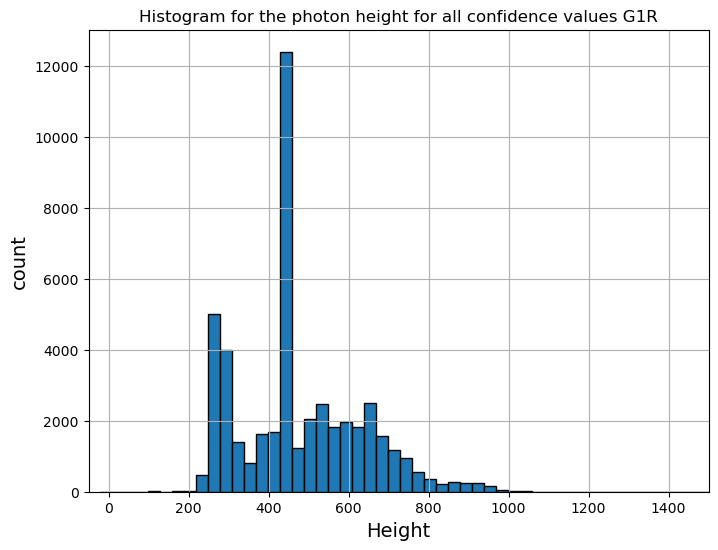

In [6]:
bins = np.arange(ATL03_list[2].Photon_Height.min(), ATL03_list[2].Photon_Height.max()+1, 30)

fig, ax1 = plt.subplots(1, 1, figsize=(8, 6))
ATL03_list[2].hist('Photon_Height', bins=bins, ec='k', lw=1, ax=ax1)
ax1.set_xlabel('Height', fontsize=14)
ax1.set_ylabel('count', fontsize=14)
ax1.set_title("Histogram for the photon height for all confidence values G1R")
ax1.set_xlim([-50, 1500])
#plt.savefig("Histogram for the photon height for all flags G1R.jpg");

In [7]:
print(ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 0].size)
print(ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == -1].size)
print(ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 1].size)
print(ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 2].size)
print(ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 3].size)
print(ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 4].size)
1531 + 17 +411 + 2581 +42614

1531
17
25
411
2581
42614


47154

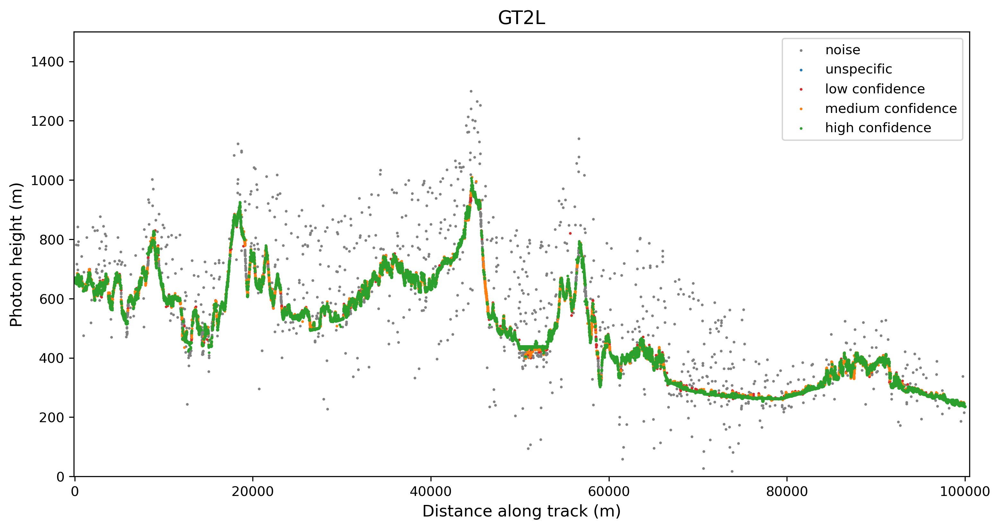

In [6]:
fig, ax = plt.subplots(1,1, figsize=(12,6))
fig.set_dpi(300)
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == 0],  ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 0],  s=1, label='noise', c='gray')
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == -1], ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == -1], s=1, label='unspecific', c='tab:blue')
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == 2],  ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 2],  s=1, label='low confidence', c='tab:red')
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == 3],  ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 3],  s=1, label='medium confidence', c='tab:orange')
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == 4],  ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 4],  s=1, label='high confidence', c='tab:green')
plt.ylim([0, 1500])
plt.xlim([-100, 100500])
ax.set_title("GT2L", fontsize=14)
ax.set_ylabel('Photon height (m)', fontsize=12)
ax.set_xlabel('Distance along track (m)', fontsize=12)
ax.legend(fontsize=10);
plt.savefig('GT2L.png', bbox_inches='tight')

In [298]:
# create new df that includes all photons of ATL03 df swath 1 that have a confidence level of 2 or higher (low confidence or better)
ATL_conf = ATL03_list[2][ATL03_list[2]['Land'] >= 4]

# create numpy array from ATL_conf that includes only distance along track and photon height
xy = ATL_conf[['alongtrack_real', 'Photon_Height']].to_numpy()
xx = ATL_conf[['alongtrack_real', 'Photon_Height', "Latitude", "Longitude"]].to_numpy()

In [106]:
xx[:,2]
#ATL_conf["Latitude"]

array([31.94160064, 31.9415688 , 31.94156238, ..., 31.04379484,
       31.04374389, 31.04371203])

Text(0.5, 1.0, 'Ratio filtering for ground photon retrieval')

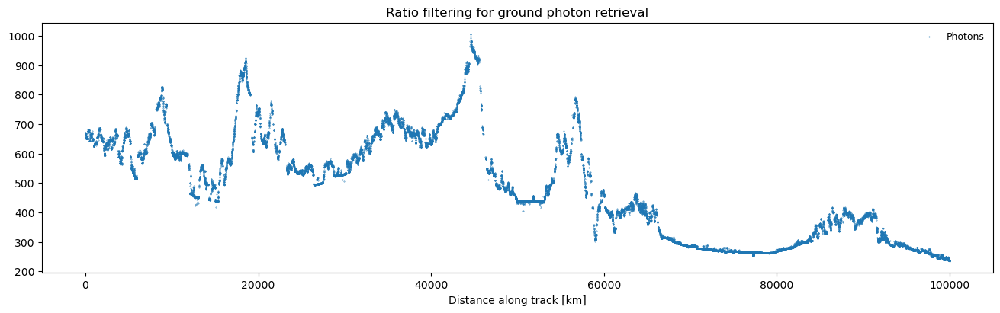

In [10]:
fig, ax = plt.subplots(figsize=(13,4), constrained_layout = True)
ax.scatter(xy[:,0], xy[:,1], s=0.1, label='Photons')
ax.legend(frameon=False, fontsize=9)
ax.set_xlabel('Distance along track [km]')
ax.set_title('Ratio filtering for ground photon retrieval')

In [9]:
#ATL_conf

In [10]:
s = 0
l =  ATL_conf['alongtrack_real'].max()

ATL_conf = ATL03_list[2][ATL03_list[2]['Land'] >= 4]

xy = ATL_conf[['alongtrack_real', 'Photon_Height']].to_numpy()

# create new array that is subsetted by defined segment
xy = xy[(xy[:,0] >= s) & (xy[:,0] < s+l)]

# create new df: subset the confidence df by defined section
ATL_sub = ATL_conf[(ATL_conf['alongtrack_real'] >= s) & (ATL_conf['alongtrack_real'] < s+l)]

# create geodataframe from subsetted ATL03 df, add geometry column from photon's longitude and latitude in wgs84 crs
gdf = gp.GeoDataFrame(ATL_sub, geometry=gp.points_from_xy(ATL_sub.Longitude, ATL_sub.Latitude), crs=4326)
# write geometry to a list of coordinates
coord_list = [(x,y) for x,y in zip(gdf['geometry'].x , gdf['geometry'].y)]

In [14]:
# Export as a Shapefile
#out_file = f"beam_new.shp"
    
# save the GeoDataFrame to a shapefile
#warnings.simplefilter('ignore', category=UserWarning)
#gdf.to_file(out_file, driver='ESRI Shapefile')

CHECKING DATA

PLOTTING ON THE MAP

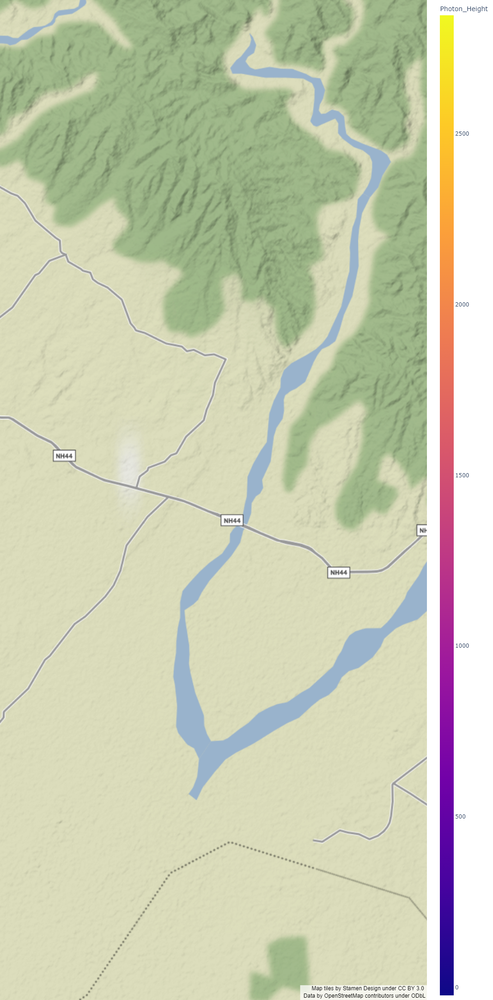

In [21]:
import plotly.express as px
fig = px.scatter_mapbox(ATL03_list[2], 
                        lat='Latitude', 
                        lon='Longitude',
                        color='Photon_Height', zoom=9)
fig.update_layout(mapbox_style="stamen-terrain")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [8]:
data = {'Longitude': xx[:,3], 'Latitude': xx[:,2], "Height" : xx[:,1], "alongtrack" : xy[:,0] }
df_regression = pd.DataFrame(data)
df_regression

,Longitude,Latitude,Height,alongtrack
0,76.477910,31.941588,671.921692,0.000795
1,76.477909,31.941582,674.898438,0.001832
2,76.477908,31.941569,675.156250,0.003877
3,76.477908,31.941569,676.543030,0.003884
4,76.477907,31.941563,677.123413,0.004909
...,...,...,...,...
156975,76.363592,30.935539,210.557312,162.345883
156976,76.363592,30.935533,210.487076,162.346907
156977,76.363591,30.935527,210.323166,162.347929
156978,76.363590,30.935520,210.491287,162.348953


SCIPY POLINOMIAL FIT

In [361]:
from scipy.interpolate import LSQUnivariateSpline
from shapely.geometry import LineString
import geopandas as gpd
from shapely.geometry import Point

# knots
t = np.arange(xx[0,0]+1, xx[-1,0]-1, 100)
# initialize
spl = LSQUnivariateSpline(xx[:,0], xx[:,1], t)
# Define new x-coordinates for interpolation
xs = np.linspace(xx[0,0]+1, xx[-1,0]-1, 42614)

In [ ]:
# Define the file path for the shapefile
output_shapefile = "interpolation_curve.shp"

# Export the GeoDataFrame to a shapefile
gdf.to_file(output_shapefile)

SLOPE FINDING

In [362]:
# Generate a sample topographic curve
x = xs
y = spl(xs)

# Calculate the slope at each point on the curve using numerical differentiation
dx = x[1] - x[0]
dydx = np.gradient(y, dx)

# Identify points where the slope is close to 0
tolerance = 0.0001
flat_points = np.where(np.abs(dydx) < tolerance)[0]

#Vertical zones
vertical_lines = [10000,20000,30000,40000,50000,60000,70000,80000,90000]

In [380]:
flat_points.size

157

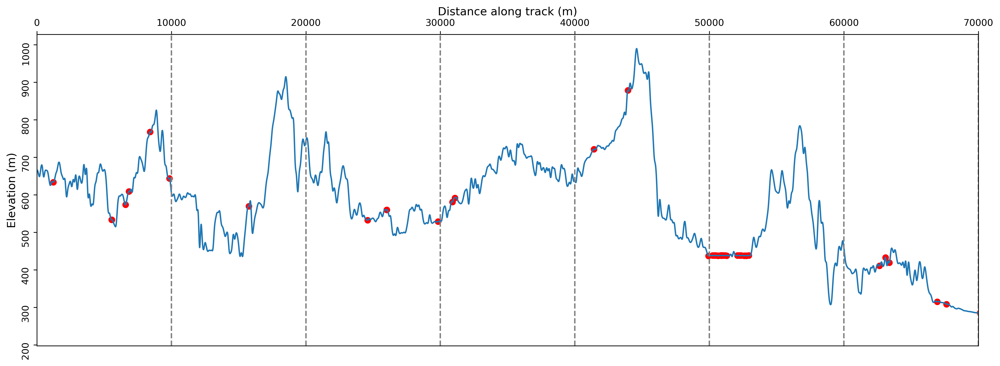

In [383]:
# Plot the results
fig, ax = plt.subplots(figsize=(18,6))
fig.set_dpi(300)
ax.plot(x, y, label="LSQ Interpolation")
#ax.plot(y, x, label="LSQ Interpolation")

ax.scatter(x[flat_points], y[flat_points], color='red', label='Flat areas')
#ax.scatter(y[flat_points], x[flat_points], color='red', label='Flat areas')


#plt.title("Topographic profile with areas close to 0.05°")
for line in vertical_lines:
    plt.axvline(x=line, color='grey', linestyle='--')
#ax.legend()
ax.set_xlim(0, 70000)
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
#ax.set_ylim(1000, 200)
ax.set_yticks(range(200, 1100, 100))
ax.set_yticklabels(range(200, 1100, 100), rotation=90)
#plt.axis([0, 60000, 200, 1050])
plt.xlabel('Distance along track (m)', fontsize=12)
plt.ylabel("Elevation (m)", fontsize=12)
plt.savefig("Int and flat areas.png", bbox_inches='tight')

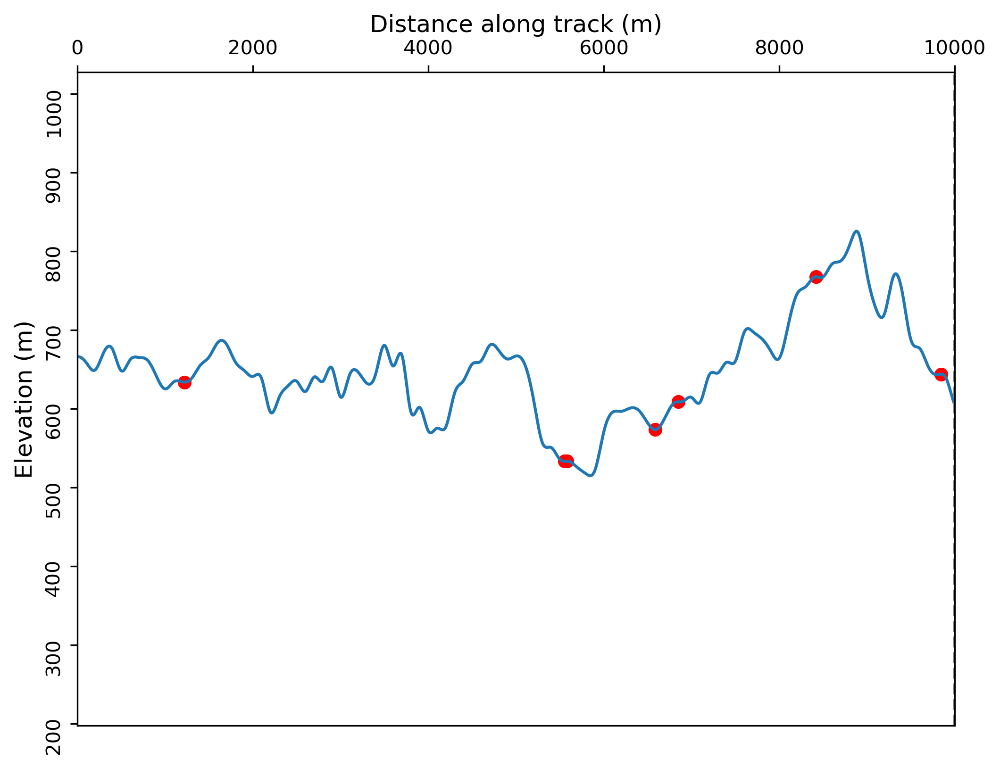

In [374]:
# Plot the results
fig, ax = plt.subplots(figsize=(8,6))
fig.set_dpi(300)
ax.plot(x, y, label="LSQ Interpolation")
#ax.plot(y, x, label="LSQ Interpolation")

ax.scatter(x[flat_points], y[flat_points], color='red', label='Flat areas')
#ax.scatter(y[flat_points], x[flat_points], color='red', label='Flat areas')


#plt.title("Topographic profile with areas close to 0.05°")
for line in vertical_lines:
    plt.axvline(x=line, color='grey', linestyle='--')
#ax.legend()
ax.set_xlim(0, 10000)
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
#ax.set_ylim(1000, 200)
ax.set_yticks(range(200, 1100, 100))
ax.set_yticklabels(range(200, 1100, 100), rotation=90)
#plt.axis([0, 60000, 200, 1050])
plt.xlabel('Distance along track (m)', fontsize=12)
plt.ylabel("Elevation (m)", fontsize=12)
plt.savefig("Zoom Int and flat areas.png", bbox_inches='tight')

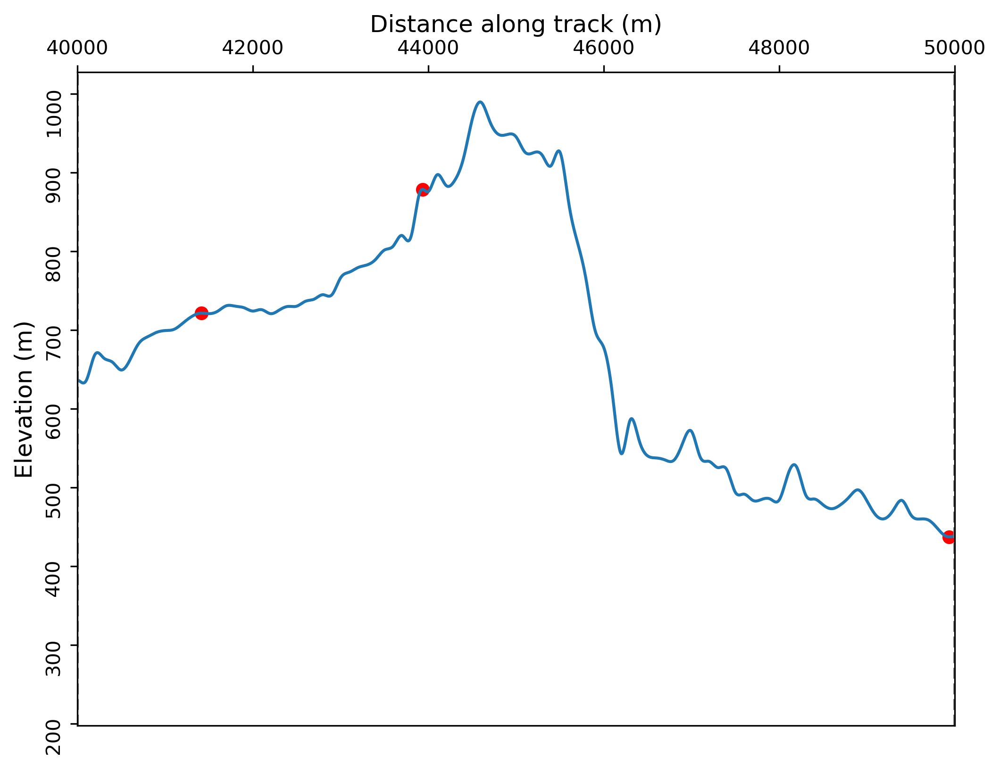

In [387]:
# Plot the results
fig, ax = plt.subplots(figsize=(8,6))
fig.set_dpi(300)
ax.plot(x, y, label="LSQ Interpolation")
#ax.plot(y, x, label="LSQ Interpolation")

ax.scatter(x[flat_points], y[flat_points], color='red', label='Flat areas')
#ax.scatter(y[flat_points], x[flat_points], color='red', label='Flat areas')


#plt.title("Topographic profile with areas close to 0.05°")
for line in vertical_lines:
    plt.axvline(x=line, color='grey', linestyle='--')
#ax.legend()
ax.set_xlim(40000, 50000)
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
#ax.set_ylim(1000, 200)
ax.set_yticks(range(200, 1100, 100))
ax.set_yticklabels(range(200, 1100, 100), rotation=90)
#plt.axis([0, 60000, 200, 1050])
plt.xlabel('Distance along track (m)', fontsize=12)
plt.ylabel("Elevation (m)", fontsize=12)
plt.savefig("Zoom 2 Int and flat areas.png", bbox_inches='tight')

In [ ]:
# Plot the results
fig, ax = plt.subplots(figsize=(12,6))
fig.set_dpi(300)
ax.plot(x, y, label="LSQ Interpolation")
#ax.plot(y, x, label="LSQ Interpolation")

ax.scatter(x[flat_points], y[flat_points], color='red', label='Flat areas')
#ax.scatter(y[flat_points], x[flat_points], color='red', label='Flat areas')


#plt.title("Topographic profile with areas close to 0.05°")
for line in vertical_lines:
    plt.axvline(x=line, color='grey', linestyle='--')
#ax.legend()
ax.set_xlim(0, 10000)
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
#ax.set_ylim(1000, 200)
ax.set_yticks(range(200, 1100, 100))
ax.set_yticklabels(range(200, 1100, 100), rotation=90)
#plt.axis([0, 60000, 200, 1050])
plt.xlabel('Distance along track (m)', fontsize=12)
plt.ylabel("Elevation (m)", fontsize=12)
#plt.savefig("Int and flat areas.png", bbox_inches='tight')

EXPORTING THE FLAT AREAS

In [356]:
x = xs
y = spl(xs)

# Calculate the slope at each point on the curve using numerical differentiation
dx = xs[1] - xs[0]
dydx = np.gradient(y, dx)

# Identify points where the slope is close to 0
tolerance = 0.0001
flat_points = np.where(np.abs(dydx) < tolerance)[0]

In [368]:
# Create a list of Point geometries for the flat points
points = [Point(xx[:,2][i], xx[:,3][i]) for i in flat_points]

# Create a binary column indicating flat points (1) or not (0)
binary_column = np.zeros(len(xx))
binary_column[flat_points] = 1

#flat_values = xx[flat_points, 1]  # Assuming the flat point values are in the second column (Photon_Height)
data = {"flat_points": binary_column}

df = gpd.GeoDataFrame(data, geometry=gp.points_from_xy(xx[:, 3], xx[:, 2], crs=4326))

# Define the file path for the shapefile
#output_shapefile = "flat_points_mod.shp"

# save the GeoDataFrame to a shapefile
#warnings.simplefilter('ignore', category=UserWarning)
#df.to_file(output_shapefile, driver='ESRI Shapefile')

In [367]:
df

,flat_points,geometry
0,0.0,POINT (76.47839 31.94160)
1,0.0,POINT (76.47839 31.94157)
2,0.0,POINT (76.47839 31.94156)
3,0.0,POINT (76.47838 31.94148)
4,0.0,POINT (76.47838 31.94142)
...,...,...
42609,0.0,POINT (76.37671 31.04381)
42610,0.0,POINT (76.37671 31.04379)
42611,0.0,POINT (76.37671 31.04379)
42612,0.0,POINT (76.37670 31.04374)


SLOPE THRESHOLDING AND VARIANCE

In [227]:
# DataFrame
data = {'Xs': xs, 'Spl': spl(xs)}
df_regression = pd.DataFrame(data)

# Number of rows to extract in each portion
portion_size = 10500

# Extract portions of the DataFrame
portions = []
start_idx = 0
while start_idx < len(df_regression):
    end_idx = min(start_idx + portion_size, len(df_regression))
    portion = df_regression.iloc[start_idx:end_idx]
    portions.append(portion)
    start_idx += portion_size


In [228]:
x_hist = df_regression[['Xs', 'Spl']].to_numpy()
x_hist_2000 = portions[0][['Xs', 'Spl']].to_numpy()
x_hist_4000 = portions[1][['Xs', 'Spl']].to_numpy()
x_hist_6000 = portions[2][['Xs', 'Spl']].to_numpy()
x_hist_8000 = portions[3][['Xs', 'Spl']].to_numpy()
x_hist_10000 = portions[4][['Xs', 'Spl']].to_numpy()

In [229]:
def calculate_slope_degrees(data):
    # Extract alongtrack and height columns
    alongtrack = data[:, 0]
    height = data[:, 1]
    # Calculate the first derivative (slope) using finite differences
    slope = np.gradient(height, alongtrack)
    # Convert slope to degrees
    slope_degrees = np.degrees(np.arctan(slope))
    return slope_degrees

In [230]:
slope_degrees = calculate_slope_degrees(x_hist)
abs_slope = np.abs(slope_degrees)
slope_bins = np.arange(0,90,2)

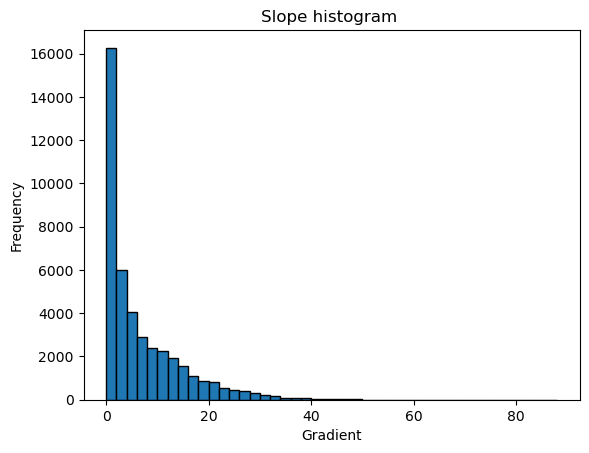

In [231]:
# Plot histogram of trimmed data
plt.hist(abs_slope, slope_bins, edgecolor='black')
plt.xlabel("Gradient")
plt.ylabel("Frequency")
plt.title("Slope histogram ")
plt.show()

In [232]:
slope_degrees = calculate_slope_degrees(x_hist_2000)
abs_slope_2000 = np.abs(slope_degrees)

slope_degrees = calculate_slope_degrees(x_hist_4000)
abs_slope_4000 = np.abs(slope_degrees)

slope_degrees = calculate_slope_degrees(x_hist_6000)
abs_slope_6000 = np.abs(slope_degrees)

slope_degrees = calculate_slope_degrees(x_hist_8000)
abs_slope_8000 = np.abs(slope_degrees)

slope_degrees = calculate_slope_degrees(x_hist_10000)
abs_slope_10000 = np.abs(slope_degrees)

In [233]:
#Copernicus_DSM_slp_deg = np_slope_deg(xy, 10)
#Copernicus_DSM_slp_deg = slope_degrees

range_min = 0
range_max = 90

#Slope
slp_deg_hist_2000, slp_deg_bin_edges = np.histogram(abs_slope_2000, slope_bins)
slp_deg_bin_centers_2000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

slp_deg_hist_4000, slp_deg_bin_edges = np.histogram(abs_slope_4000, slope_bins)
slp_deg_bin_centers_4000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

slp_deg_hist_6000, slp_deg_bin_edges = np.histogram(abs_slope_6000, slope_bins)
slp_deg_bin_centers_6000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

slp_deg_hist_8000, slp_deg_bin_edges = np.histogram(abs_slope_8000, slope_bins)
slp_deg_bin_centers_8000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

slp_deg_hist_10000, slp_deg_bin_edges = np.histogram(abs_slope_10000, slope_bins)
slp_deg_bin_centers_10000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

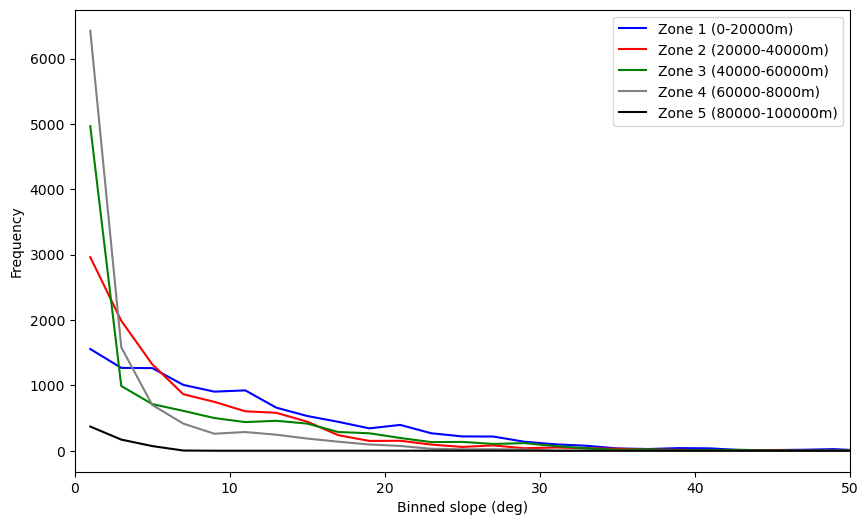

In [388]:
fg, ax = plt.subplots(1, 1, figsize=(10,6))
fig.set_dpi(300)
im=ax.plot(slp_deg_bin_centers_2000, slp_deg_hist_2000, "b-", label="Zone 1 (0-20000m)")
im=ax.plot(slp_deg_bin_centers_4000, slp_deg_hist_4000, "r-", label="Zone 2 (20000-40000m)")
im=ax.plot(slp_deg_bin_centers_6000, slp_deg_hist_6000, "green", label="Zone 3 (40000-60000m)")
im=ax.plot(slp_deg_bin_centers_8000, slp_deg_hist_8000, "gray", label="Zone 4 (60000-8000m)")
im=ax.plot(slp_deg_bin_centers_10000, slp_deg_hist_10000, "k-", label="Zone 5 (80000-100000m)")
ax.set_xlabel('Binned slope (deg)')
ax.set_ylabel('Frequency')
ax.set_xlim(0,50)
#ax.grid('on')
#plt.title('Slope comparison per zones every 20.000 m')
plt.legend()
plt.savefig("Slope distribution per sectors.png", bbox_inches='tight')

# Define the threshold slope
#threshold_slope = 5  # Replace with your desired threshold value

# Calculate the absolute value of the slope and threshold slope
#abs_slope = np.abs(slope)
#abs_threshold_slope = np.full_like(abs_slope, threshold_slope)  # Create an array with the threshold slope values

## COMPARISSON WITH DEM

In [390]:
# Copernicus GLO-30 DEM
src_glo30 = rasterio.open(r'D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\Qgis\output_COP30.tif')
array_glo30 = src_glo30.read(1)
array_glo30[array_glo30==src_glo30.nodata] = np.nan

# JAX 3m DEM
src_qdt3 = rasterio.open(r'D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\Qgis\N031E076\ALPSMLC30_N031E076_DSM.tif')
array_qdt3 = src_qdt3.read(1, masked=True).astype(float)
array_qdt3[array_qdt3==src_qdt3.nodata] = np.nan

# SRTM Sector 51 5 m DEM
src_salta5 = rasterio.open(r'D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\Qgis\n31_e076_1arc_v3.tif')
array_salta5 = src_salta5.read(1).astype(float)
array_salta5[array_salta5==src_salta5.nodata] = np.nan

# Geoid (to correct differences in vertical datum)
src_geoid = rasterio.open(r'D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\Qgis\us_nga_egm2008_1.tif')
array_geoid = src_geoid.read(1)
array_geoid[array_geoid==src_geoid.nodata] = np.nan

In [391]:
s = 0
l =  ATL_conf['alongtrack_real'].max()

ATL_conf = ATL03_list[2][ATL03_list[2]['Land'] >= 4]

xy = ATL_conf[['alongtrack_real', 'Photon_Height']].to_numpy()

# create new array that is subsetted by defined segment
xy = xy[(xy[:,0] >= s) & (xy[:,0] < s+l)]

# create new df: subset the confidence df by defined section
ATL_sub = ATL_conf[(ATL_conf['alongtrack_real'] >= s) & (ATL_conf['alongtrack_real'] < s+l)]

# create geodataframe from subsetted ATL03 df, add geometry column from photon's longitude and latitude in wgs84 crs
gdf = gp.GeoDataFrame(ATL_sub, geometry=gp.points_from_xy(ATL_sub.Longitude, ATL_sub.Latitude), crs=4326)
# write geometry to a list of coordinates
coord_list = [(x,y) for x,y in zip(gdf['geometry'].x , gdf['geometry'].y)]

In [392]:
# write values of DEMs at the coordinate in the list to a new column in the geodataframe
gdf['geoid_undul'] = [x for x in src_geoid.sample(coord_list)]
gdf['geoid_float'] = gdf.geoid_undul.astype(float)

gdf['glo30_height'] = [x for x in src_glo30.sample(coord_list)]
gdf['glo30_float'] = gdf.glo30_height.astype(float)
# fix difference between height crs (geoid undulation)
gdf['glo30_ell'] = np.add(gdf.glo30_float, gdf.geoid_float).astype(float)

gdf_swath1 = gdf.drop(['geoid_undul', 'glo30_height', 'glo30_float'], axis=1)

gdf['qdt3_height'] = [x for x in src_qdt3.sample(coord_list)]
gdf['qdt3_float'] = gdf.qdt3_height.astype(float)
    # nodata value is converted to nan to not influence results
gdf['qdt3_float'] = np.add(gdf.qdt3_float, gdf.geoid_float)
#gdf = gdf.replace(src_qdt3.nodata, np.nan)
    
gdf['salta5_height'] = [x for x in src_salta5.sample(coord_list)]
gdf['salta5_float'] = gdf.salta5_height.astype(float)
#gdf = gdf.replace(src_salta5.nodata, np.nan)
gdf['salta5_float'] = np.add(gdf.salta5_float, gdf.geoid_float)
    
    # salta DEM has some areas where difference to GLO-30 is very large (up to 250 meters) --> set those values to nan
#gdf.salta5_float[(gdf.glo30_ell - gdf.salta5_float) > 30] = np.nan
    
    # new dataframe where initial sample columns are dropped (float columns remain)
gdf2 = gdf.drop(['geoid_undul', 'glo30_height', 'glo30_float', 'qdt3_height', 'salta5_height'], axis=1)

In [23]:
gdf2.head()

,index,Latitude,Longitude,Along-track_Distance,Photon_Height,Land,Easting,Northing,crosstrack,alongtrack,alongtrack_real,geometry,geoid_float,glo30_ell,qdt3_float,salta5_float
0,2014554,31.941601,76.478392,7.425650,662.776489,4.0,915236.419361,1.021388e+06,-9060.646292,3.158456e+06,0.000000,POINT (76.47839 31.94160),-40.361244,658.488182,662.638756,667.638756
1,2014555,31.941569,76.478389,10.974275,667.443848,4.0,915236.035971,1.021384e+06,-9060.586049,3.158460e+06,3.547181,POINT (76.47839 31.94157),-40.361244,658.488182,662.638756,667.638756
2,2014556,31.941562,76.478388,11.687121,666.245544,4.0,915235.987396,1.021384e+06,-9060.602610,3.158460e+06,4.260874,POINT (76.47839 31.94156),-40.361244,658.488182,662.638756,667.638756
3,2014557,31.941479,76.478381,0.886371,663.302673,4.0,915235.189831,1.021374e+06,-9060.648767,3.158470e+06,13.513125,POINT (76.47838 31.94148),-40.361244,658.278404,662.638756,665.638756
4,2014558,31.941415,76.478376,8.013362,655.304871,4.0,915234.652410,1.021367e+06,-9060.761662,3.158477e+06,20.640961,POINT (76.47838 31.94142),-40.361244,658.278404,662.638756,665.638756


SCATTER PLOTS

In [23]:
x = gdf2["Photon_Height"]
y = gdf2["glo30_ell"]

res = stats.linregress(x, y)
B_est, A_est, r, p, se_B, se_A = res.slope, res.intercept, res.rvalue, res.pvalue, res.stderr, res.intercept_stderr
y_est = A_est + B_est * x
resid = y - y_est
r2 = r**2
n = x.size
ssr = np.sum((resid) ** 2)
rmse = np.sqrt(ssr / (n - 2))
residuals = y - (res.slope * x + res.intercept)
predicted = res.intercept + res.slope * x
mae = np.mean(np.abs(predicted - y))

In [ ]:
#print(f"{res.pvalue:.1e}")
fig, ax = plt.subplots(1,1,figsize=(16,6))
#fig.set_dpi(300)
ax.plot(gdf2.alongtrack_real, gdf2.Photon_Height, color='grey', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='COP-30')
plt.plot(xs, spl(xs), color="b", label="Interpolation")
ax.set_title('Comparison of COP-30 and and original data')
ax.legend(frameon=False, fontsize=9)
ax.set_ylabel('Elevation [m]')
ax.set_xlabel('Distance along track [km]')
plt.axis([20000, 40000, 450, 800])

In [393]:
x = gdf2.Photon_Height
y = [gdf2.glo30_ell, gdf2.qdt3_float, gdf2.salta5_float]
names_DEM = ["Copernicus", "JAXA", "SRTM"]
r2_gdem = []
yest_gdem = []
ssr_gdem = []
predicted_gdem = []
mae_gdem = []
rmse_gdem = []
best = []
aest = []
seb = []
sea = []
residuals_list = []

In [394]:
for i in range(len(y)):
    res = stats.linregress(x, y[i])
    B_est, A_est, r, p, se_B, se_A = res.slope, res.intercept, res.rvalue, res.pvalue, res.stderr, res.intercept_stderr
    y_est = A_est + B_est * x
    resid = y[i] - y_est
    r2 = r**2
    n = x.size
    ssr = np.sum((resid) ** 2)
    #mse = (ssr / (n - 2))
    rmse = np.sqrt(ssr / (n - 2))
    predicted = res.intercept + res.slope * x
    mae = np.mean(np.abs(predicted - y[i]))
    residuals = y[i] - (res.slope * x + res.intercept)
    
    best.append(B_est)
    aest.append(A_est)
    seb.append(se_B)
    sea.append(se_A)
    yest_gdem.append(y_est)
    r2_gdem.append(r2)
    ssr_gdem.append(ssr)
    predicted_gdem.append(predicted)
    mae_gdem.append(mae)
    rmse_gdem.append(rmse)
    residuals_list.append(residuals)

In [395]:
# set the confidence level, 0.05 is 95%
alpha = 0.05

# use scipy to look up the t-value for given parameters
t = stats.t.ppf(1 - (alpha/2), n - 2)

print("critical t-value at {:.1f}% confidence with {} degrees of freedom: {:.3f}"\
      .format(100*(1 - alpha), n - 2, t))
print("t-statistic for slope (number of standard errors that the slope differs from 0 slope): {:.3f}"\
      .format(r * np.sqrt(n - 2) / np.sqrt(1 - r**2)))

critical t-value at 95.0% confidence with 42611 degrees of freedom: 1.960
t-statistic for slope (number of standard errors that the slope differs from 0 slope): 4028.847


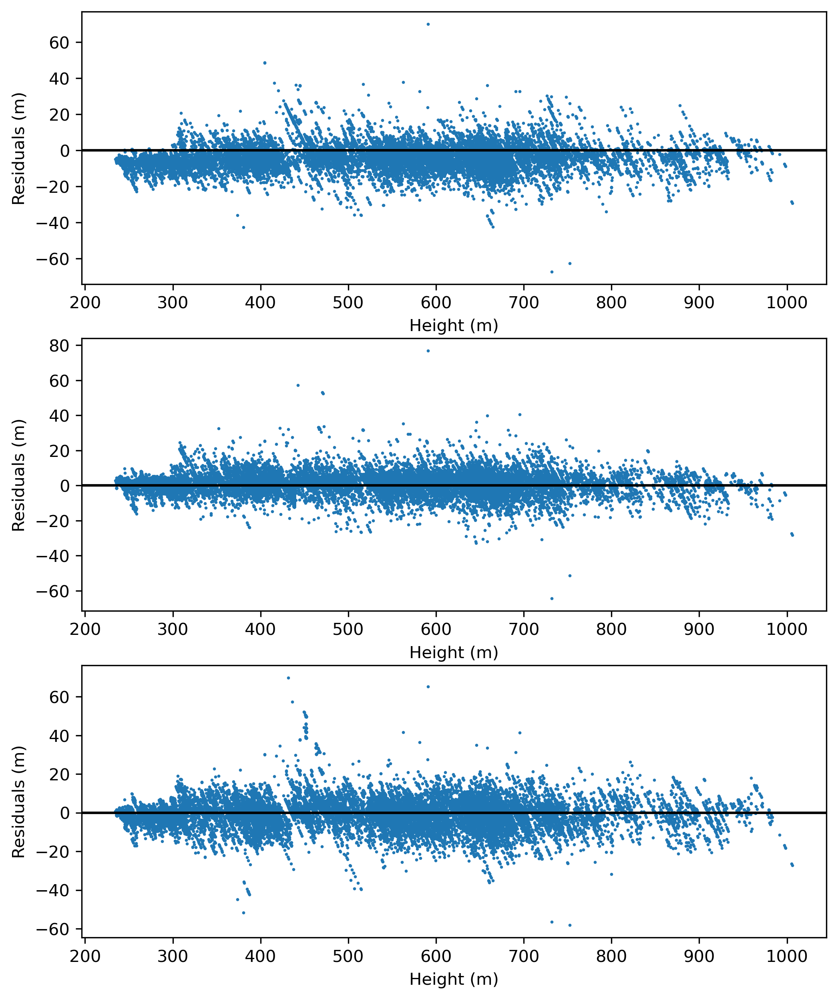

In [199]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10))
#fig.tight_layout()
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)
#fig.suptitle("Residuals ICESAt-2 vs GDEMs", x=0.51, y=0.92)
#R$^2$ = {:0.2f}, r2_gdem[0],

ax1.scatter(x, residuals_list[0],s=0.7)#, "blue")#, s=0.5)
ax2.scatter(x, residuals_list[1],s=0.7)#, "green", s=0.5)
ax3.scatter(x, residuals_list[2],s=0.7)#, "red", s=0.5)

ax1.axhline(0, color='k')
ax2.axhline(0, color='k')
ax3.axhline(0, color='k')
    
#ax1.set_title(f"Residuals Copernicus vs ICESat-2\nσ = {np.std(residuals_list[0]):.2f}")
#ax2.set_title(f"Residuals AW3D vs ICESat-2\nσ = {np.std(residuals_list[1]):.2f}")
#ax3.set_title(f"Residuals SRTM vs ICESat-2\nσ = {np.std(residuals_list[2]):.2f}")

#label=f'Residuals for kN = {j}: μ = {np.mean(diff):.2f}, σ = {np.std(diff):.2f}'

ax1.set_xlabel('Height (m)', fontsize=10)
ax1.set_ylabel('Residuals (m)', fontsize=10)
#ax1.legend(fontsize=12)


ax2.set_xlabel('Height (m)', fontsize=10)
ax2.set_ylabel('Residuals (m)', fontsize=10)
#ax2.legend(fontsize=12)


ax3.set_xlabel('Height (m)', fontsize=10)
ax3.set_ylabel('Residuals (m)', fontsize=10)
#ax3.legend(fontsize=12)

plt.savefig("Residuals ICESat-2 vs Global DEMs with statistics.png", bbox_inches='tight')

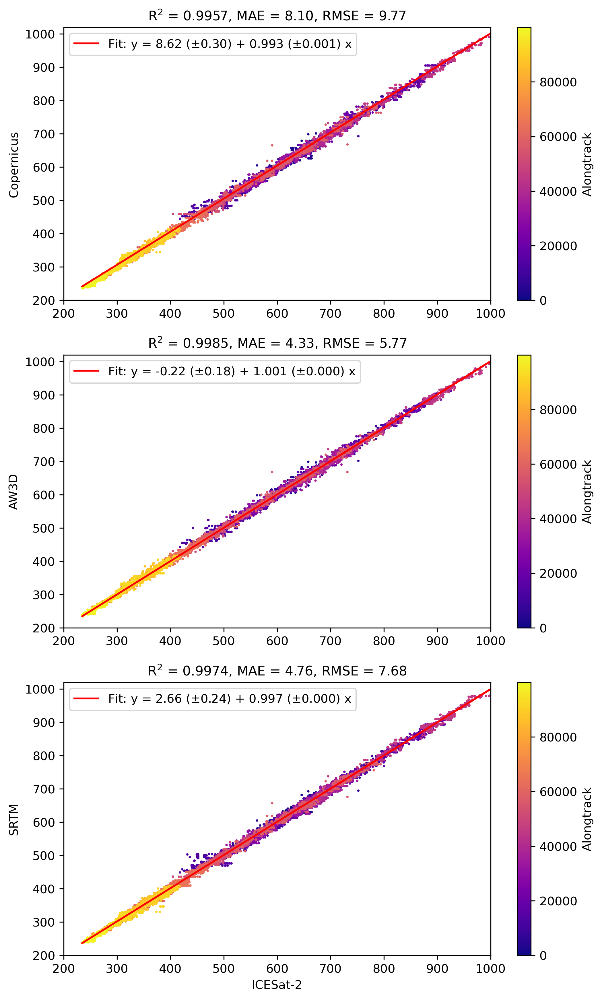

In [404]:
fig, axes = plt.subplots(3, 1, figsize=(8, 14))
#fig.tight_layout()
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)
#fig.suptitle("ICESAt-2 vs GDEMs", x=0.44, y=0.92)
#R$^2$ = {:0.2f}, r2_gdem[0],

a = ax1.scatter(x, y[0], c=gdf2.alongtrack_real, cmap='plasma', s=1)
b = ax2.scatter(x, y[1], c=gdf2.alongtrack_real, cmap='plasma', s=1)
c = ax3.scatter(x, y[2], c=gdf2.alongtrack_real, cmap='plasma', s=1)
    
ax1.set_title("R$^2$ = {:0.4f}, MAE = {:0.2f}, RMSE = {:0.2f}".format(r2_gdem[0], mae_gdem[0], rmse_gdem[0]), fontsize=11)#Copernicus vs ICESat-2\nAW3D vs ICESat-2\n
ax2.set_title("R$^2$ = {:0.4f}, MAE = {:0.2f}, RMSE = {:0.2f}".format(r2_gdem[1], mae_gdem[1], rmse_gdem[1]), fontsize=11)
ax3.set_title("R$^2$ = {:0.4f}, MAE = {:0.2f}, RMSE = {:0.2f}".format(r2_gdem[2], mae_gdem[2], rmse_gdem[2]), fontsize=11)#SRTM vs ICESat-2\n

ax1.plot(x, yest_gdem[0], 'r-', 
         label="Fit: y = {:0.2f} ($\pm${:0.2f}) + {:0.3f} ($\pm${:0.3f}) x".format(aest[0], t * sea[0], best[0], t * seb[0]))
ax2.plot(x, yest_gdem[1], 'r-', 
         label='Fit: y = {:0.2f} ($\pm${:0.2f}) + {:0.3f} ($\pm${:0.3f}) x'.format(aest[1], t * sea[1], best[1], t * seb[1]))
ax3.plot(x, yest_gdem[2], 'r-', 
         label='Fit: y = {:0.2f} ($\pm${:0.2f}) + {:0.3f} ($\pm${:0.3f}) x'.format(aest[2], t * sea[2], best[2], t * seb[2]))
   
cbar = plt.colorbar(a, label="Alongtrack")
#ax1.set_xlabel('ICESat-2', fontsize=10)
ax1.set_ylabel('Copernicus', fontsize=10)
ax1.axis([200, 1000, 200, 1020])
ax1.legend(fontsize=10)

cbar = plt.colorbar(b, label="Alongtrack")
#ax2.set_xlabel('ICESat-2', fontsize=10)
ax2.set_ylabel('AW3D', fontsize=10)
ax2.axis([200, 1000, 200, 1020])
ax2.legend(fontsize=10)

cbar = plt.colorbar(c, label="Alongtrack")
ax3.set_xlabel('ICESat-2', fontsize=10)
ax3.set_ylabel('SRTM', fontsize=10)
ax3.axis([200, 1000, 200, 1020])
ax3.legend(fontsize=10)

plt.savefig("ICESat-2 vs Global DEMs with statistics.png", bbox_inches='tight')

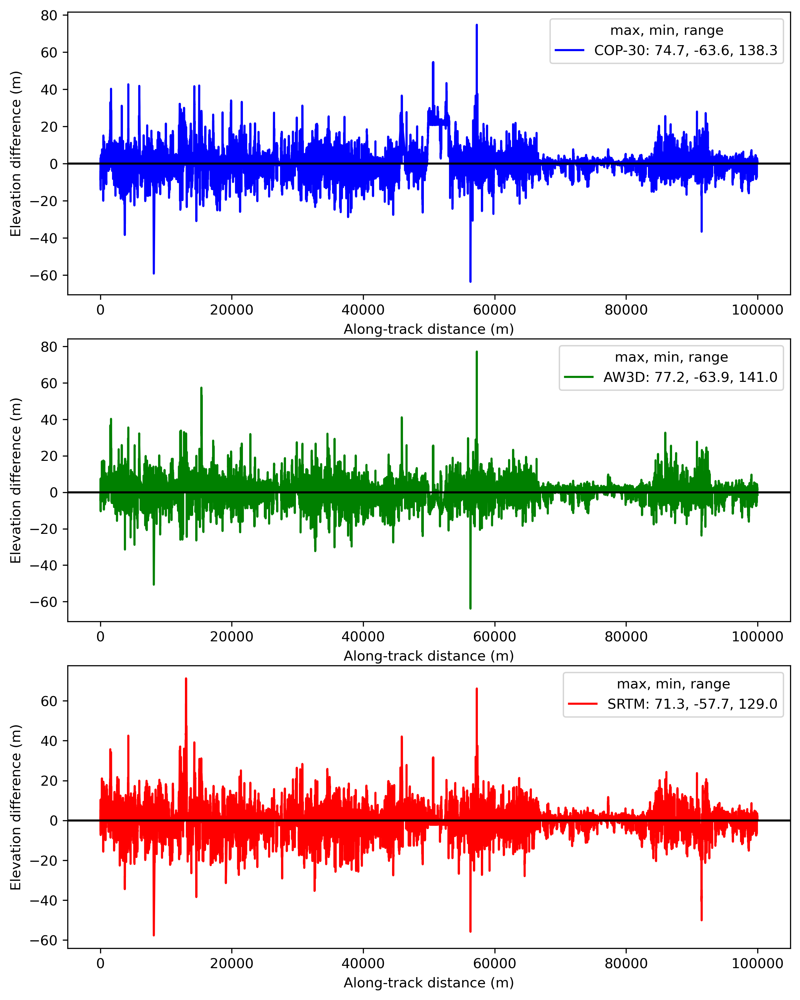

In [192]:
x = gdf2.Photon_Height
y = [gdf2.glo30_ell, gdf2.qdt3_float, gdf2.salta5_float]
names_DEM = ["Copernicus", "JAXA", "SRTM"]

fig, axes = plt.subplots(3, 1, figsize=(8, 10))
fig.tight_layout()
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)

diff = gdf2.glo30_ell - gdf2.Photon_Height
ax1.plot(gdf2.alongtrack_real, diff, "b", label=f'COP-30: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

diff = gdf2.qdt3_float - gdf2.Photon_Height
ax2.plot(gdf2.alongtrack_real, diff, "g", label=f'AW3D: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

diff = gdf2.salta5_float - gdf2.Photon_Height
ax3.plot(gdf2.alongtrack_real, diff, "red", label=f'SRTM: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

ax1.axhline(0, color='k')
ax2.axhline(0, color='k')
ax3.axhline(0, color='k')
    
#ax1.set_title(f"Residuals Copernicus vs ICESat-2\nσ = {np.std(residuals_list[0]):.2f}")
#ax2.set_title(f"Residuals AW3D vs ICESat-2\nσ = {np.std(residuals_list[1]):.2f}")
#ax3.set_title(f"Residuals SRTM vs ICESat-2\nσ = {np.std(residuals_list[2]):.2f}")

#label=f'Residuals for kN = {j}: μ = {np.mean(diff):.2f}, σ = {np.std(diff):.2f}'

ax1.set_xlabel('Along-track distance (m)', fontsize=10)
ax1.set_ylabel('Elevation difference (m)', fontsize=10)

ax2.set_xlabel('Along-track distance (m)', fontsize=10)
ax2.set_ylabel('Elevation difference (m)', fontsize=10)

ax3.set_xlabel('Along-track distance (m)', fontsize=10)
ax3.set_ylabel('Elevation difference (m)', fontsize=10)

ax1.legend(fontsize=10, title='max, min, range', title_fontsize=10);
ax2.legend(fontsize=10, title='max, min, range', title_fontsize=10);
ax3.legend(fontsize=10, title='max, min, range', title_fontsize=10);


plt.savefig('Elevation difference.png', bbox_inches='tight')

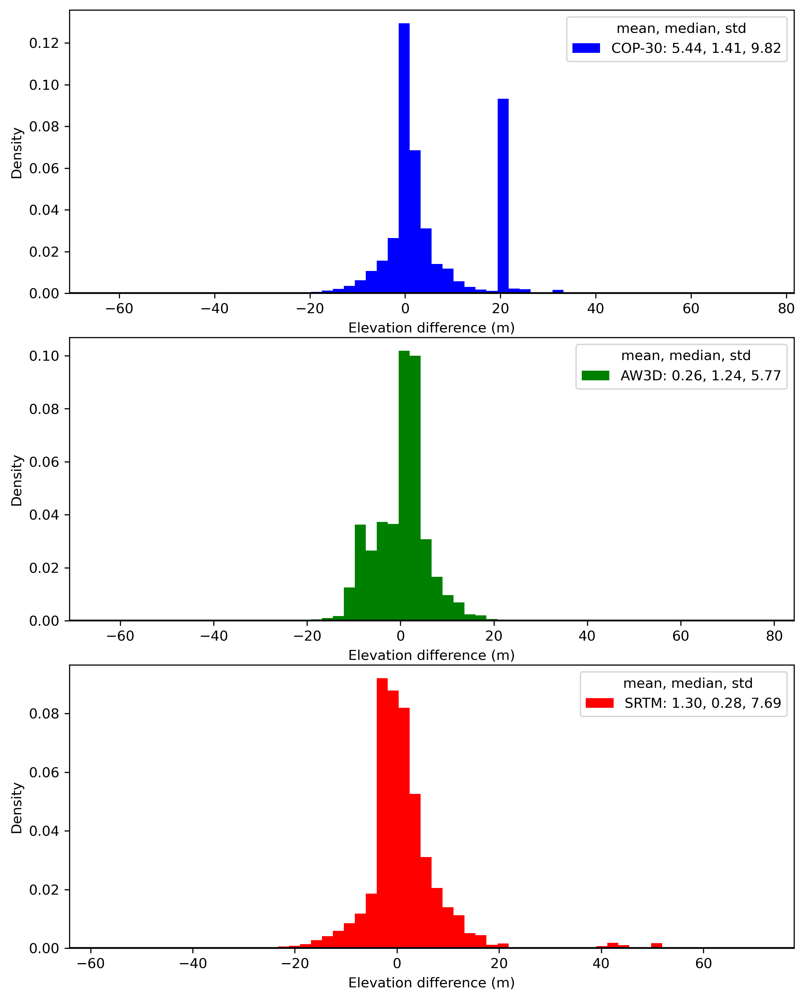

In [193]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10))
fig.tight_layout()
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)

diff = gdf2.glo30_ell - gdf2.Photon_Height
ax1.hist(diff, bins=60, density=True, color = "b", label=f'COP-30: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')


diff = gdf2.qdt3_float - gdf2.Photon_Height
ax2.hist(diff, bins=60, density=True, color = "g", label=f'AW3D: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')

diff = gdf2.salta5_float - gdf2.Photon_Height
ax3.hist(diff, bins=60, density=True, color = "red", label=f'SRTM: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')

ax1.axhline(0, color='k')
ax2.axhline(0, color='k')
ax3.axhline(0, color='k')
    
#ax1.set_title(f"Residuals Copernicus vs ICESat-2\nσ = {np.std(residuals_list[0]):.2f}")
#ax2.set_title(f"Residuals AW3D vs ICESat-2\nσ = {np.std(residuals_list[1]):.2f}")
#ax3.set_title(f"Residuals SRTM vs ICESat-2\nσ = {np.std(residuals_list[2]):.2f}")

#label=f'Residuals for kN = {j}: μ = {np.mean(diff):.2f}, σ = {np.std(diff):.2f}'

ax1.set_ylabel('Density', fontsize=10)
ax1.set_xlabel('Elevation difference (m)', fontsize=10)

ax2.set_ylabel('Density', fontsize=10)
ax2.set_xlabel('Elevation difference (m)', fontsize=10)

ax3.set_ylabel('Density', fontsize=10)
ax3.set_xlabel('Elevation difference (m)', fontsize=10)

ax1.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);
ax2.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);
ax3.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);


plt.savefig('Density.png', bbox_inches='tight')

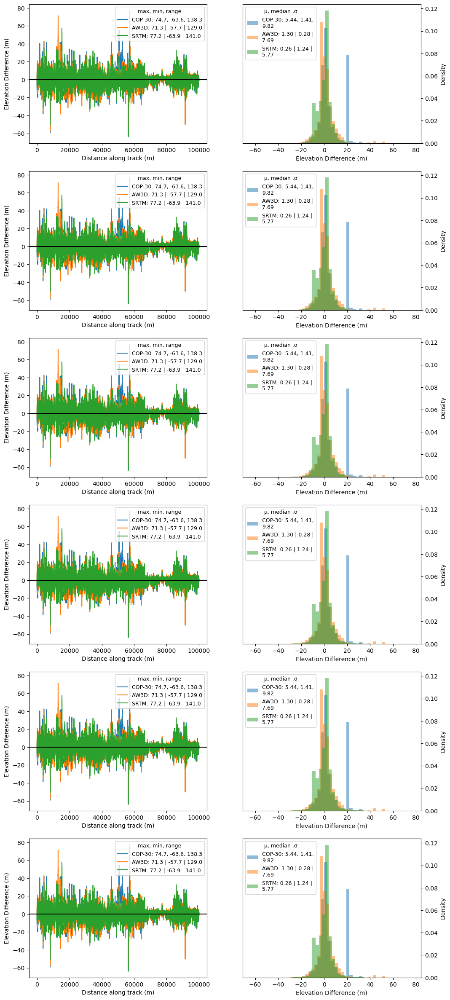

In [36]:
#x = gdf2.Photon_Height
#y = [gdf2.glo30_ell, gdf2.qdt3_float, gdf2.salta5_float]

fig, ax = plt.subplots(6,2,figsize=(12,30))
ax = ax.ravel()
#fig.set_dpi(300)

for i, j, k in zip(range(6), np.arange(0,12,2), np.arange(1,13,2)):
    #gdf = gp.read_file(f'../data/swaths/swath{i}.shp')
    diff = gdf2.glo30_ell - gdf2.Photon_Height
    ax[j].plot(gdf2.alongtrack_real, diff, label=f'COP-30: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')
    ax[k].hist(diff, bins=50, density=True, alpha=0.5, label=f'COP-30: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f},\n{np.nanstd(diff):.2f}')
    
    diff = gdf2.salta5_float - gdf2.Photon_Height
    ax[j].plot(gdf2.alongtrack_real, diff, label=f'AW3D: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')
    ax[k].hist(diff, bins=50,  density=True, alpha=0.5, label=f'AW3D: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f} ,\n{np.nanstd(diff):.2f}')
    
    diff = gdf2.qdt3_float - gdf2.Photon_Height
    ax[j].plot(gdf2.alongtrack_real, diff, label=f'SRTM: {np.nanmax(diff):.1f} , {np.nanmin(diff):.1f} , {np.nanmax(diff)-np.nanmin(diff):.1f}')
    ax[k].hist(diff, bins=50,  density=True, alpha=0.5, label=f'SRTM: {np.nanmean(diff):.2f} , {np.nanmedian(diff):.2f} ,\n{np.nanstd(diff):.2f}')
    
    ax[j].axhline(0, c='k')
    
    ax[j].legend(fontsize=9, title='max, min, range', title_fontsize=9);
    ax[k].legend(fontsize=9, title='μ, median ,σ', title_fontsize=9);
    
    #ax[j].set_title(f'{tracknames[i]}');
    #ax[k].set_title(f'{tracknames[i]}');
    
    ax[k].yaxis.tick_right()
    ax[k].yaxis.set_label_position("right")
    ax[j].set_ylabel('Elevation Difference (m)')
    ax[k].set_ylabel('Density')
    
    ax[j].set_xlabel('Distance along track (m)')
    ax[k].set_xlabel('Elevation Difference (m)');
    

Text(0.5, 0, 'Distance along track (m)')

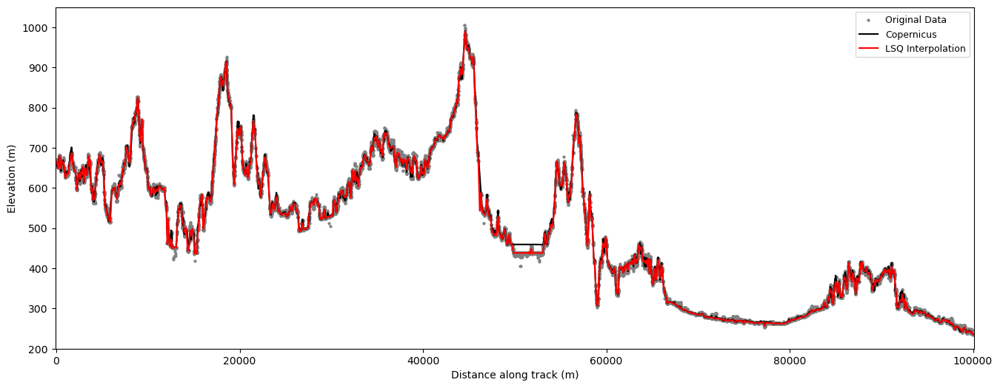

In [34]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
#fig.set_dpi(500)
ax.plot(xy[:,0], xy[:,1], 'o', markersize=2, color='grey', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='Copernicus', markersize=0.1)
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='orange', label='AW3D',  markersize=0.1)
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='blue', label='SRTM',  markersize=0.1)
ax.plot(xs, spl(xs), color="red", label="LSQ Interpolation")
plt.axis([-100, 100100, 200, 1050])
#ax.set_title('Comparison of Copernicus, AW3D, SRTM and LSQ interpolation and original data')
#ax.set_title('Comparison of Copernicus, AW3D and SRTM with original data')

ax.legend(fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
#plt.axis([30000, 33000, 500, 800])
#plt.savefig("Comparisson of COP-30, JAXA, SRTM, Polinomial fit and original data.png")
#plt.savefig("Comparisson of COP-30, AW3D and SRTM with original data.png", bbox_inches='tight')

(5000.0, 10000.0, 400.0, 1000.0)

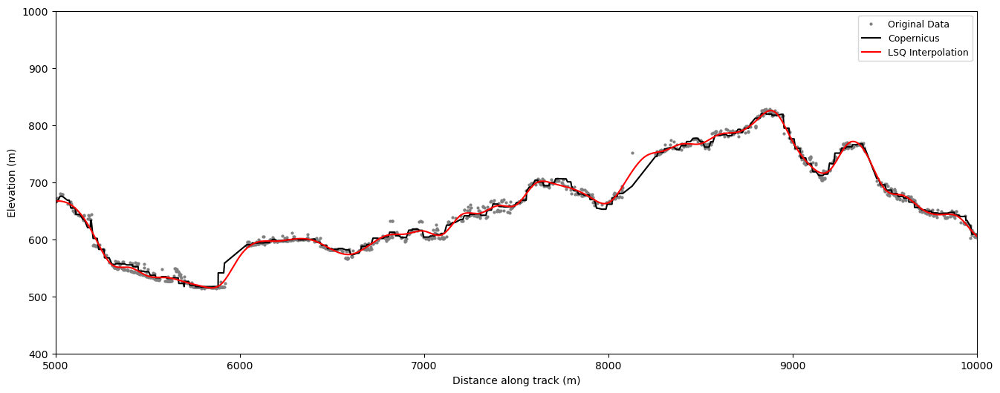

In [26]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
#fig.set_dpi(500)
ax.plot(xy[:,0], xy[:,1], "o", markersize=2, color='grey', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='Copernicus')
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='orange', label='AW3D')
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='blue', label='SRTM')
ax.plot(xs, spl(xs), color="red", label="LSQ Interpolation")
#ax.set_title('Zoom in comparisson of Copernicus, AW3D, SRTM, LSQ interpolation and original data')
ax.legend(fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
plt.axis([5000, 10000, 400, 1000])
#plt.savefig("All profiles included interpolation.png", bbox_inches='tight')

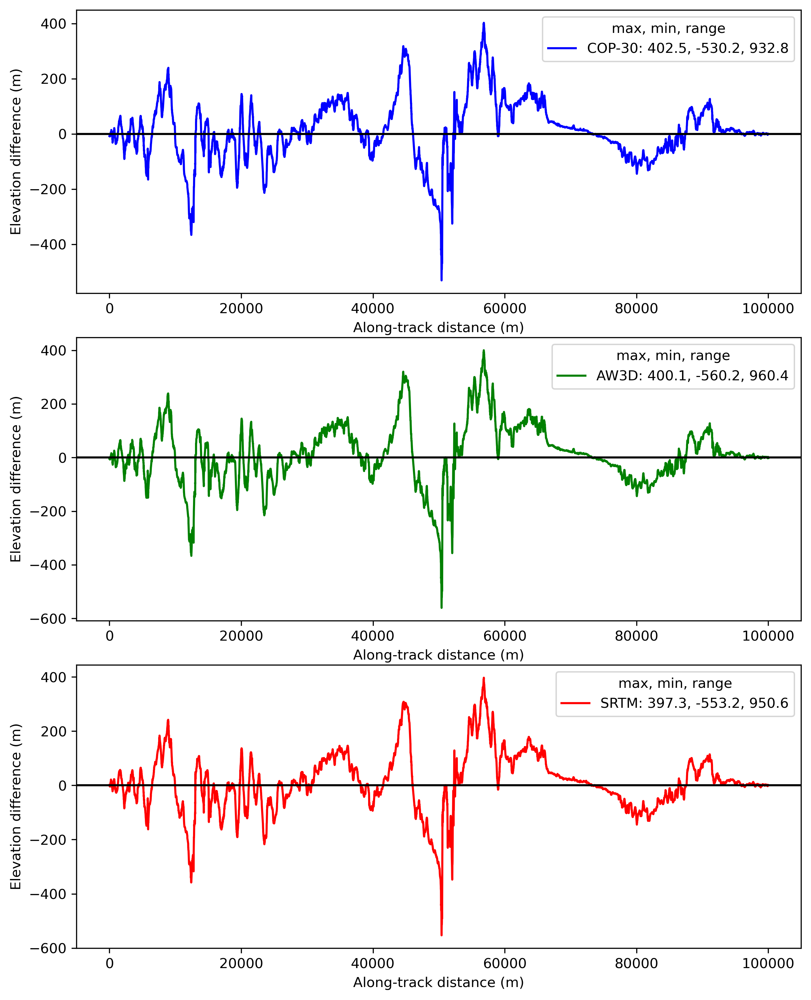

In [253]:
spl_xs_reshaped = spl(xs)[:42613]

fig, axes = plt.subplots(3, 1, figsize=(8, 10))
fig.tight_layout()
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)

diff = gdf2.glo30_ell - spl_xs_reshaped
ax1.plot(gdf2.alongtrack_real, diff, "b", label=f'COP-30: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

diff = gdf2.qdt3_float - spl_xs_reshaped
ax2.plot(gdf2.alongtrack_real, diff, "g", label=f'AW3D: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

diff = gdf2.salta5_float - spl_xs_reshaped
ax3.plot(gdf2.alongtrack_real, diff, "red", label=f'SRTM: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

ax1.axhline(0, color='k')
ax2.axhline(0, color='k')
ax3.axhline(0, color='k')
    
#ax1.set_title(f"Residuals Copernicus vs ICESat-2\nσ = {np.std(residuals_list[0]):.2f}")
#ax2.set_title(f"Residuals AW3D vs ICESat-2\nσ = {np.std(residuals_list[1]):.2f}")
#ax3.set_title(f"Residuals SRTM vs ICESat-2\nσ = {np.std(residuals_list[2]):.2f}")

#label=f'Residuals for kN = {j}: μ = {np.mean(diff):.2f}, σ = {np.std(diff):.2f}'

ax1.set_xlabel('Along-track distance (m)', fontsize=10)
ax1.set_ylabel('Elevation difference (m)', fontsize=10)

ax2.set_xlabel('Along-track distance (m)', fontsize=10)
ax2.set_ylabel('Elevation difference (m)', fontsize=10)

ax3.set_xlabel('Along-track distance (m)', fontsize=10)
ax3.set_ylabel('Elevation difference (m)', fontsize=10)

ax1.legend(fontsize=10, title='max, min, range', title_fontsize=10);
ax2.legend(fontsize=10, title='max, min, range', title_fontsize=10);
ax3.legend(fontsize=10, title='max, min, range', title_fontsize=10);
ax3.legend(fontsize=10, title='max, min, range', title_fontsize=10);


plt.savefig('Elevation Diference Interpolation.png', bbox_inches='tight')

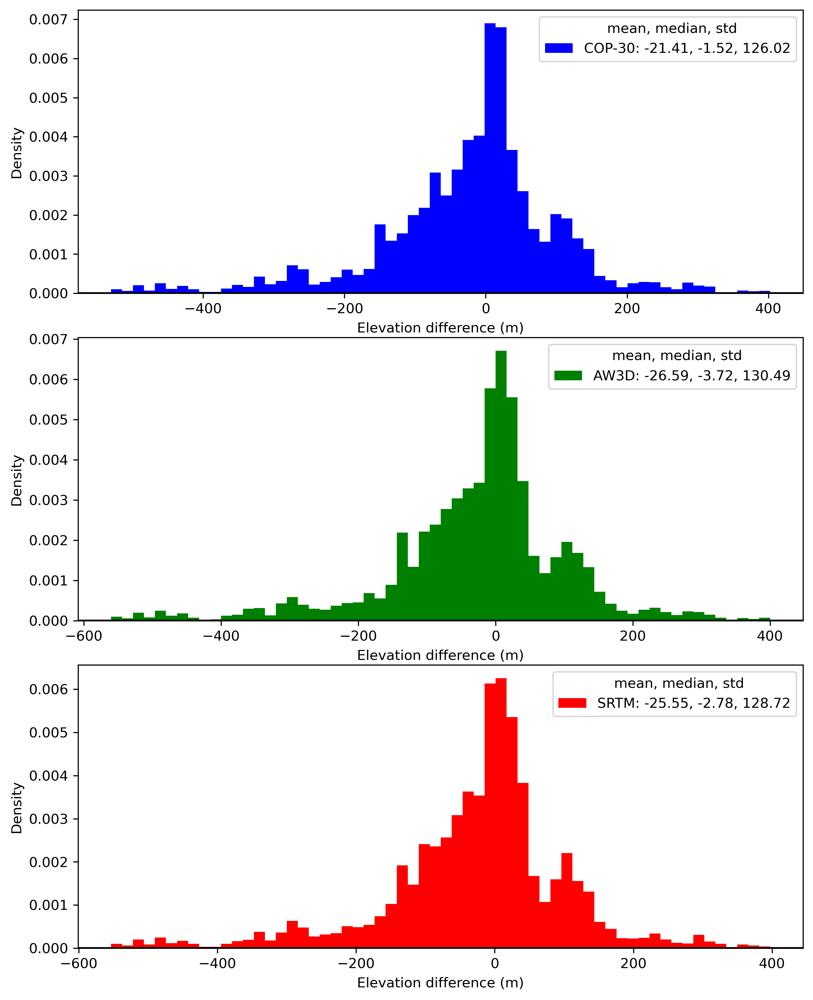

In [251]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10))
fig.tight_layout()
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)

diff = gdf2.glo30_ell - spl_xs_reshaped
ax1.hist(diff, bins=60, density=True, color = "b", label=f'COP-30: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')

diff = gdf2.qdt3_float - spl_xs_reshaped
ax2.hist(diff, bins=60, density=True, color = "g", label=f'AW3D: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')

diff = gdf2.salta5_float - spl_xs_reshaped
ax3.hist(diff, bins=60, density=True, color = "red", label=f'SRTM: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')

ax1.axhline(0, color='k')
ax2.axhline(0, color='k')
ax3.axhline(0, color='k')
    
#ax1.set_title(f"Residuals Copernicus vs ICESat-2\nσ = {np.std(residuals_list[0]):.2f}")
#ax2.set_title(f"Residuals AW3D vs ICESat-2\nσ = {np.std(residuals_list[1]):.2f}")
#ax3.set_title(f"Residuals SRTM vs ICESat-2\nσ = {np.std(residuals_list[2]):.2f}")

#label=f'Residuals for kN = {j}: μ = {np.mean(diff):.2f}, σ = {np.std(diff):.2f}'

ax1.set_ylabel('Density', fontsize=10)
ax1.set_xlabel('Elevation difference (m)', fontsize=10)

ax2.set_ylabel('Density', fontsize=10)
ax2.set_xlabel('Elevation difference (m)', fontsize=10)

ax3.set_ylabel('Density', fontsize=10)
ax3.set_xlabel('Elevation difference (m)', fontsize=10)

ax1.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);
ax2.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);
ax3.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);


plt.savefig('Density Interpolation.png', bbox_inches='tight')

(35000.0, 40000.0, 300.0, 1010.0)

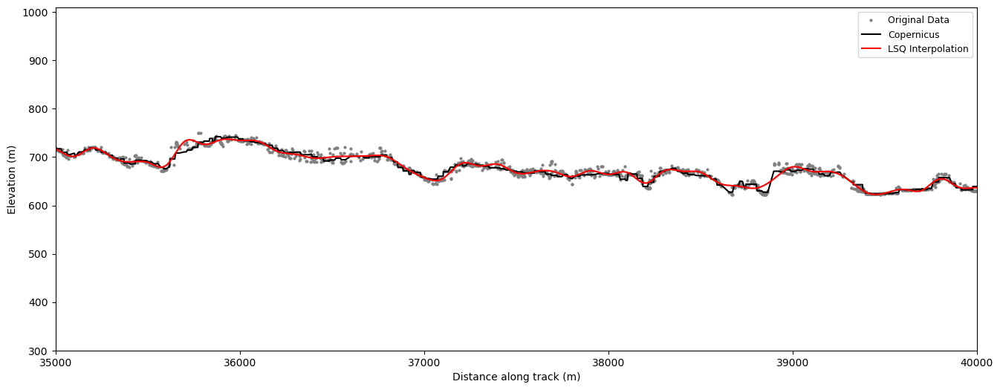

In [28]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
#fig.set_dpi(500)
ax.plot(xy[:,0], xy[:,1], "o", markersize=2, color='grey', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='Copernicus')
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='orange', label='AW3D')
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='blue', label='SRTM')
ax.plot(xs, spl(xs), color="red", label="LSQ Interpolation")
#ax.set_title('Zoom in comparisson of Copernicus, AW3D, SRTM, LSQ interpolation and original data')
ax.legend(fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
plt.axis([12100, 16100, 400, 600])
#plt.savefig("All profiles included interpolation.png", bbox_inches='tight')

(45000.0, 50000.0, 300.0, 1010.0)

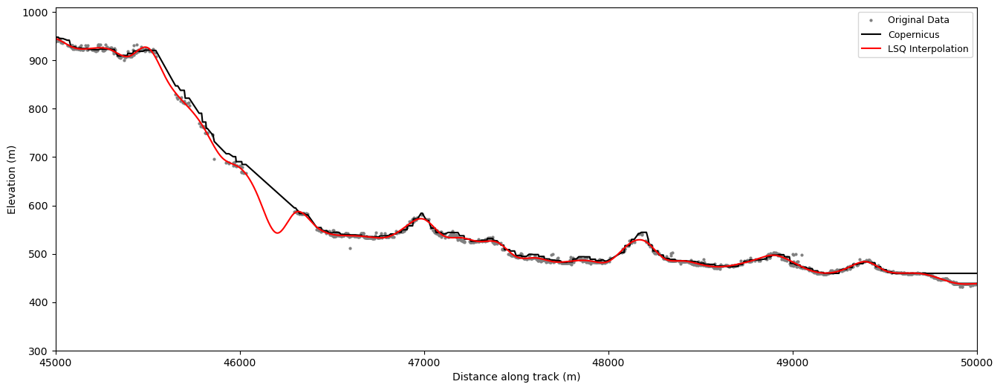

In [29]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
#fig.set_dpi(500)
ax.plot(xy[:,0], xy[:,1], "o", markersize=2, color='grey', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='Copernicus')
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='orange', label='AW3D')
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='blue', label='SRTM')
ax.plot(xs, spl(xs), color="red", label="LSQ Interpolation")
#ax.set_title('Zoom in comparisson of Copernicus, AW3D, SRTM, LSQ interpolation and original data')
ax.legend(fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
plt.axis([45000, 50000, 300, 1010])
#plt.savefig("All profiles included interpolation.png", bbox_inches='tight')

(55000.0, 60000.0, 300.0, 1010.0)

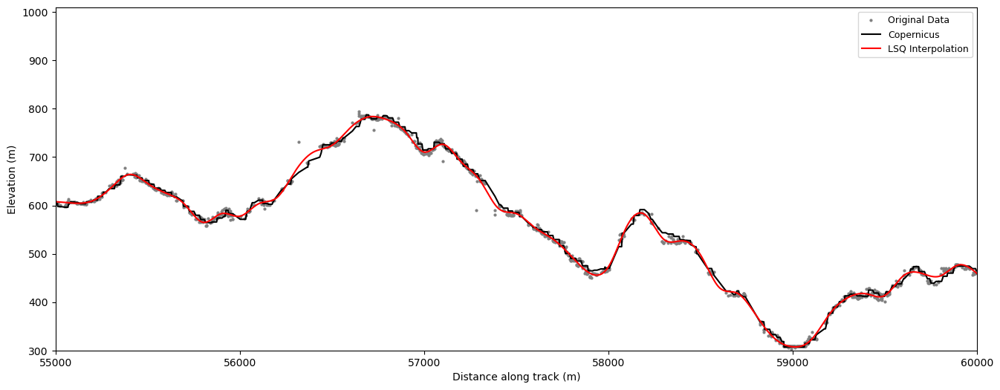

In [30]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
#fig.set_dpi(500)
ax.plot(xy[:,0], xy[:,1], "o", markersize=2, color='grey', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='Copernicus')
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='orange', label='AW3D')
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='blue', label='SRTM')
ax.plot(xs, spl(xs), color="red", label="LSQ Interpolation")
#ax.set_title('Zoom in comparisson of Copernicus, AW3D, SRTM, LSQ interpolation and original data')
ax.legend(fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
plt.axis([55000, 60000, 300, 1010])
#plt.savefig("All profiles included interpolation.png", bbox_inches='tight')

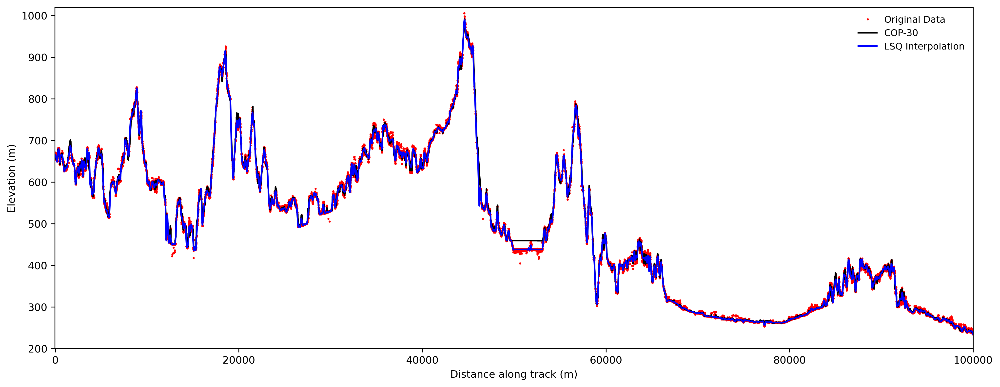

In [250]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
fig.set_dpi(300)
ax.plot(xy[:,0], xy[:,1], 'o', markersize=1, color='red', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='COP-30')
ax.plot(xs, spl(xs), color='b', label='LSQ Interpolation')
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='blue', label='AW3D')
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='green', label='SRTM')
#ax.set_title('Comparison of COP-30, JAXA, SRTM, LSQ interpolation and original data')
ax.legend(frameon=False, fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
plt.axis([-50, 100000, 200, 1020])
plt.savefig('Profile COP vs Int.png', bbox_inches='tight')

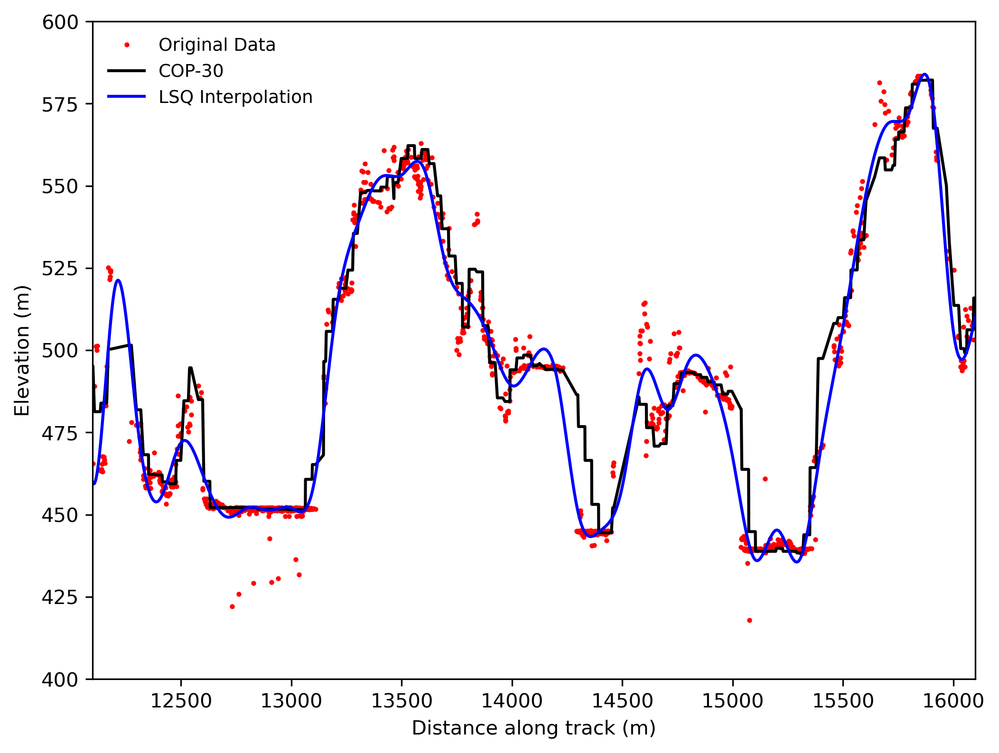

In [239]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
fig.set_dpi(300)
ax.plot(xy[:,0], xy[:,1], 'o', markersize=1.5, color='red', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='COP-30')
ax.plot(xs, spl(xs), color='b', label='LSQ Interpolation')
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='blue', label='AW3D')
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='green', label='SRTM')
#ax.set_title('Comparison of COP-30, JAXA, SRTM, LSQ interpolation and original data')
ax.legend(frameon=False, fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
plt.axis([12100, 16100, 400, 600])
#plt.axis([7000, 10000, 650, 830])
#plt.axis([20000, 40000, 450, 800])
plt.savefig('Zoom 7k_10k_Int.png', bbox_inches='tight')

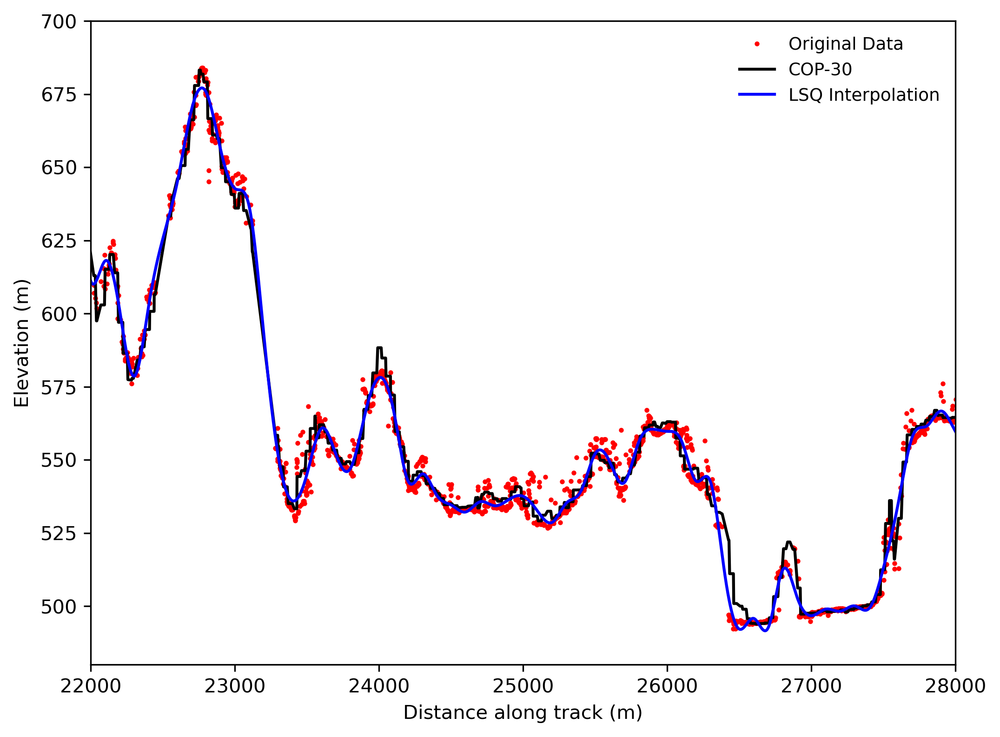

In [240]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
fig.set_dpi(300)
ax.plot(xy[:,0], xy[:,1], 'o', markersize=1.5, color='red', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='COP-30')
ax.plot(xs, spl(xs), color='b', label='LSQ Interpolation')
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='blue', label='AW3D')
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='green', label='SRTM')
#ax.set_title('Comparison of COP-30, JAXA, SRTM, LSQ interpolation and original data')
ax.legend(frameon=False, fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
#plt.axis([25000, 28000, 450, 600])
plt.axis([22000, 28000, 480, 700])

#plt.axis([20000, 40000, 450, 800])
plt.savefig('Zoom 25_28k_Int.png', bbox_inches='tight')

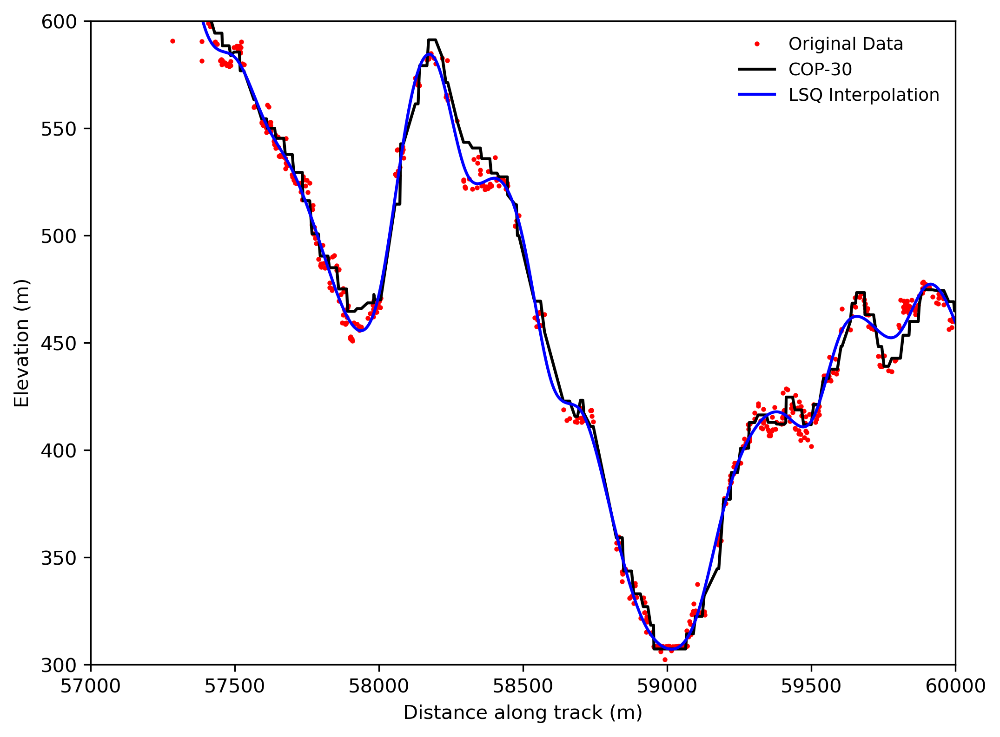

In [241]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
fig.set_dpi(300)
ax.plot(xy[:,0], xy[:,1], 'o', markersize=1.5, color='red', label="Original Data")
ax.plot(gdf2.alongtrack_real, gdf2.glo30_ell, color='k', label='COP-30')
ax.plot(xs, spl(xs), color='b', label='LSQ Interpolation')
#ax.plot(gdf2.alongtrack_real, gdf2.qdt3_float, color='blue', label='AW3D')
#ax.plot(gdf2.alongtrack_real, gdf2.salta5_float, color='green', label='SRTM')
#ax.set_title('Comparison of COP-30, JAXA, SRTM, LSQ interpolation and original data')
ax.legend(frameon=False, fontsize=9)
ax.set_ylabel('Elevation (m)')
ax.set_xlabel('Distance along track (m)')
plt.axis([57000, 60000, 300, 600])
#plt.axis([20000, 40000, 450, 800])
plt.savefig('Zoom 62k_65k_Int.png', bbox_inches='tight')

STATISTICS AND DEVIATIONS

In [13]:
data = {'Longitude': xx[:,3], 'Latitude': xx[:,2], "Height" : xx[:,1], "alongtrack" : xy[:,0] }
df_regression = pd.DataFrame(data)
df_regression["Height"].describe()

count    156980.000000
mean        449.369353
std         167.484651
min         205.728943
25%         291.344627
50%         438.184799
75%         572.158936
max        1001.614258
Name: Height, dtype: float64

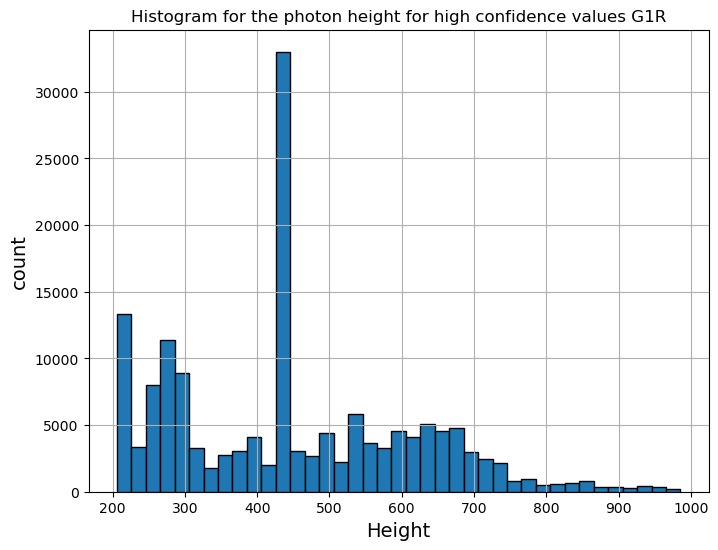

In [74]:
bins = np.arange(df_regression.Height.min(), df_regression.Height.max()+1, 20)

fig, ax1 = plt.subplots(1, 1, figsize=(8, 6))
df_regression.hist('Height', bins=bins, ec='k', lw=1, ax=ax1)
ax1.set_xlabel('Height', fontsize=14)
ax1.set_ylabel('count', fontsize=14)
ax1.set_title("Histogram for the photon height for high confidence values G1R")
#plt.savefig("Histogram for the photon height for high confidence values G1R.jpg");